In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from fbprophet import Prophet

%matplotlib inline

In [99]:
covariates = pd.read_csv('/Users/joelporcaro/Metis/project5/data/dengue_features_train.csv')
labels = pd.read_csv('/Users/joelporcaro/Metis/project5/data/dengue_labels_train.csv')
testset = pd.read_csv('/Users/joelporcaro/Metis/project5/data/dengue_features_test.csv')

In [100]:
# figure out what to do with ndvi_ne missing values
# tdtr = diurnal temperature range

# san juan outbreak threshold appears to be ~ 30
# for iquito probably ~ 15

In [101]:
def sj_condition(s):
    if s['total_cases'] > 20:
        return 1
    else:
        return 0

def iq_condition(s):
    if s['total_cases'] > 15:
        return 1
    else:
        return 0
    
def cleaner(covariates_path, labels_path):
    
    df = pd.merge(labels_path, covariates_path)
    
    sj_df = df.loc[df.city == 'sj']
    iq_df = df.loc[df.city == 'iq']

    sj_df['outbreak'] = sj_df.apply(sj_condition, axis=1)
    iq_df['outbreak'] = iq_df.apply(iq_condition, axis=1)
    
    sj_cols = sj_df.columns.tolist()
    sj_cols = sj_cols[-1:] + sj_cols[:-1]
    sj_df = sj_df[sj_cols]
    
    iq_cols = iq_df.columns.tolist()
    iq_cols = iq_cols[-1:] + iq_cols[:-1]
    iq_df = iq_df[iq_cols]
    
    sj_df.interpolate(inplace=True)
    iq_df.interpolate(inplace=True)
    
    sj_df['week_start_date'] = pd.to_datetime(sj_df['week_start_date'])
    iq_df['week_start_date'] = pd.to_datetime(iq_df['week_start_date'])
    
    iq_df = iq_df.drop(iq_df.index[:72])
    
    return sj_df, iq_df

In [102]:
sj_df, iq_df = cleaner(covariates_path=covariates, labels_path=labels)

/Users/joelporcaro/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/Users/joelporcaro/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [7]:
sj_df.describe()

,outbreak,year,weekofyear,total_cases,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,...,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,0.471154,1998.826923,26.503205,34.180556,0.058096,0.066264,0.177090,0.166088,35.385304,299.157295,...,30.423622,78.568907,35.385304,16.546255,2.514225,26.997940,6.753892,31.596207,22.593803,26.778846
std,0.499434,5.212076,15.021909,51.381372,0.102660,0.091292,0.056926,0.055776,44.528272,1.236323,...,35.522802,3.380444,44.528272,1.558857,0.498134,1.415530,0.835684,1.719618,1.505416,29.241411
min,0.000000,1990.000000,1.000000,0.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,295.938571,...,0.000000,66.735714,0.000000,11.715714,1.357143,22.842857,4.528571,26.700000,17.800000,0.000000
25%,0.000000,1994.000000,13.750000,9.000000,0.004267,0.016487,0.138936,0.129457,0.000000,298.190714,...,10.900000,76.246786,0.000000,15.225714,2.157143,25.814286,6.200000,30.600000,21.700000,6.900000
50%,0.000000,1999.000000,26.500000,19.000000,0.058129,0.065950,0.176523,0.166900,20.775000,299.239286,...,21.300000,78.670714,20.775000,16.832143,2.450000,27.214286,6.757143,31.700000,22.800000,17.800000
75%,1.000000,2003.000000,39.250000,37.000000,0.111223,0.113512,0.211596,0.202264,52.125000,300.130714,...,36.925000,80.947143,52.125000,17.854286,2.789286,28.175000,7.285714,32.800000,23.900000,35.525000
max,1.000000,2008.000000,53.000000,461.000000,0.493400,0.437100,0.393129,0.381420,390.600000,302.200000,...,570.500000,87.575714,390.600000,19.440000,4.428571,30.071429,9.914286,35.600000,25.600000,305.900000


In [35]:
iq_df.describe()

,outbreak,year,weekofyear,total_cases,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,...,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000,448.000000
mean,0.160714,2005.700893,26.116071,8.763393,0.263154,0.238735,0.247349,0.265143,65.586027,297.870649,...,59.514431,89.457387,65.586027,17.283099,8.960236,27.562493,10.374295,33.961272,21.344643,64.692969
std,0.367678,2.509008,15.212144,11.142650,0.082648,0.076343,0.077056,0.085710,35.606888,1.099122,...,49.473241,6.874316,35.606888,1.371862,2.296155,0.930086,1.553164,1.359472,1.220882,65.548874
min,0.000000,2001.000000,1.000000,0.000000,0.061729,0.058950,0.029880,0.064743,0.000000,294.635714,...,0.100000,64.658571,0.000000,12.111429,3.714286,21.400000,5.200000,30.100000,16.400000,0.000000
25%,0.000000,2004.000000,13.000000,2.000000,0.199254,0.179350,0.192214,0.201514,40.037500,297.139286,...,27.547500,85.644643,40.037500,16.460714,7.296429,27.015000,9.200000,33.100000,20.800000,18.000000
50%,0.000000,2006.000000,25.000000,5.000000,0.261964,0.232498,0.245593,0.260871,61.535000,297.822857,...,49.150000,91.681429,61.535000,17.610000,8.728571,27.650000,10.363333,33.900000,21.500000,47.200000
75%,0.000000,2008.000000,39.000000,10.000000,0.320246,0.290811,0.297768,0.322754,86.877500,298.574286,...,71.900000,94.674643,86.877500,18.262143,10.728571,28.100000,11.500000,34.900000,22.200000,89.375000
max,1.000000,2010.000000,53.000000,116.000000,0.508357,0.454429,0.538314,0.545729,210.830000,301.175714,...,362.030000,98.610000,210.830000,20.461429,16.028571,30.800000,15.800000,42.200000,24.200000,543.300000


In [41]:
iq_df.loc[iq_df.year==2009]

,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
1378,0,iq,2009,1,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,...,67.575,88.545714,53.695,17.855000,8.921429,27.673333,11.560000,35.1,21.15,43.30
1379,0,iq,2009,2,10,2009-01-08,0.229917,0.122340,0.261167,0.223050,...,93.550,95.222857,52.280,18.461429,7.500000,27.266667,11.100000,34.8,21.10,86.10
1380,0,iq,2009,3,11,2009-01-15,0.188486,0.188186,0.203914,0.277500,...,149.770,98.610000,72.030,17.995714,3.714286,27.180000,10.240000,33.3,21.10,72.80
1381,1,iq,2009,4,29,2009-01-22,0.188457,0.199314,0.202700,0.213929,...,53.810,92.467143,76.160,16.641429,6.485714,27.566667,10.700000,34.0,21.80,11.20
1382,1,iq,2009,5,35,2009-01-29,0.166733,0.173733,0.190433,0.161717,...,66.100,94.928571,118.540,18.130000,8.142857,27.650000,11.650000,33.9,21.10,67.80
1383,1,iq,2009,6,30,2009-02-05,0.279914,0.240286,0.195729,0.307657,...,93.300,97.007143,149.060,18.484286,5.185714,27.466667,12.333333,35.0,21.00,44.10
1384,1,iq,2009,7,20,2009-02-12,0.170271,0.151114,0.140471,0.142971,...,48.720,94.234286,60.510,17.765714,7.171429,28.100000,12.333333,35.0,21.20,14.00
1385,1,iq,2009,8,21,2009-02-19,0.188786,0.159457,0.156871,0.202986,...,124.000,92.905714,124.800,17.852857,6.828571,27.700000,12.540000,35.0,20.50,111.40
1386,0,iq,2009,9,12,2009-02-26,0.282360,0.305117,0.294083,0.316017,...,102.720,95.121429,147.440,18.128571,7.071429,26.580000,10.520000,33.2,20.50,84.10
1387,0,iq,2009,10,9,2009-03-05,0.362071,0.336700,0.345300,0.379286,...,87.280,94.378571,58.560,18.354286,6.800000,28.400000,11.450000,35.0,21.00,49.10


In [51]:
sj_time_series = sj_df[(sj_df.year > 2001) & (sj_df.year < 2008)]

# df[(df['date'] > '2002-1-1 01:00:00') & (df['date'] <= '2002-1-1 04:00:00')]

In [50]:
iq_time_series = iq_df[(iq_df.year > 2001) & (iq_df.year < 2008)]


In [47]:
iq_df.reset_index()

,index,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,1008,0,iq,2001,47,1,2001-11-19,0.329700,0.330417,0.340643,...,56.30,88.837143,65.890,18.451429,9.228571,27.575000,11.575000,33.70,20.8,31.00
1,1009,0,iq,2001,48,1,2001-11-26,0.301500,0.361300,0.305571,...,31.50,87.377143,47.460,17.427143,8.014286,28.233333,11.666667,35.30,21.8,12.20
2,1010,0,iq,2001,49,1,2001-12-03,0.325057,0.226471,0.299257,...,158.50,87.240000,46.860,17.595714,8.871429,28.425000,11.650000,35.50,21.2,23.10
3,1011,0,iq,2001,50,2,2001-12-10,0.326033,0.235533,0.315571,...,72.94,96.118571,138.220,19.305714,7.785714,27.840000,10.960000,35.00,21.0,75.00
4,1012,0,iq,2001,51,4,2001-12-17,0.222943,0.224071,0.212814,...,85.90,93.947143,43.950,18.965714,7.385714,27.075000,9.500000,32.90,21.0,57.90
5,1013,0,iq,2001,52,1,2001-12-24,0.298189,0.338078,0.288789,...,109.64,96.355714,100.720,19.302857,6.500000,27.350000,8.650000,33.30,22.0,25.10
6,1014,0,iq,2002,1,4,2002-01-01,0.405729,0.348400,0.368643,...,109.80,94.588571,70.160,17.618571,5.942857,27.950000,9.450000,33.20,23.0,45.30
7,1015,0,iq,2002,2,11,2002-01-08,0.327583,0.375917,0.410267,...,5.50,76.602857,64.790,16.482857,11.400000,28.966667,11.933333,35.40,21.0,7.10
8,1016,1,iq,2002,3,16,2002-01-15,0.241086,0.145650,0.278029,...,4.70,75.204286,22.770,16.157143,12.128571,28.800000,12.766667,36.00,22.0,5.00
9,1017,1,iq,2002,4,23,2002-01-22,0.104129,0.148329,0.112186,...,19.91,81.527143,121.070,16.677143,10.214286,27.940000,11.800000,35.80,21.0,18.00


In [42]:
sj_df[555:]

,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
555,1,sj,2001,1,28,2001-01-01,0.004833,0.006633,0.210814,0.202414,...,1.30,76.505714,0.00,15.444286,3.285714,25.128571,7.685714,30.0,20.6,1.9
556,0,sj,2001,2,14,2001-01-08,0.094367,0.095800,0.204100,0.164683,...,1.00,74.335714,49.81,15.078571,3.314286,25.314286,7.585714,30.6,21.1,15.2
557,0,sj,2001,3,17,2001-01-15,0.067733,0.021650,0.185850,0.179686,...,1.10,71.941429,0.00,13.921429,3.414286,25.071429,8.157143,30.6,19.4,4.8
558,0,sj,2001,4,20,2001-01-22,0.041100,0.051400,0.218471,0.228771,...,10.24,75.380000,0.00,14.732857,2.142857,24.957143,6.871429,29.4,20.6,31.5
559,0,sj,2001,5,17,2001-01-29,0.009150,0.041225,0.243471,0.203257,...,32.36,79.031429,23.78,15.378571,2.742857,25.242857,6.814286,30.6,21.1,21.6
560,0,sj,2001,6,10,2001-02-05,-0.017850,-0.005600,0.164500,0.161971,...,11.20,74.344286,10.73,14.408571,2.114286,25.000000,6.828571,29.4,21.1,8.5
561,0,sj,2001,7,13,2001-02-12,-0.044850,0.005600,0.160300,0.167429,...,22.28,75.851429,0.00,14.754286,2.342857,25.342857,6.885714,29.4,21.1,4.8
562,0,sj,2001,8,20,2001-02-19,0.217033,0.145233,0.228071,0.210457,...,3.02,73.072857,0.00,14.098571,2.142857,24.757143,7.000000,28.9,19.4,17.6
563,0,sj,2001,9,9,2001-02-26,0.446267,0.312300,0.337500,0.273283,...,25.89,76.907143,0.00,14.265714,2.014286,24.814286,5.242857,28.3,21.7,53.1
564,0,sj,2001,10,18,2001-03-05,0.248500,0.254450,0.276429,0.256714,...,0.50,73.387143,6.84,13.671429,3.142857,24.700000,7.457143,31.7,19.4,0.0


In [43]:
iq_df[:1377]

,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
1008,0,iq,2001,47,1,2001-11-19,0.329700,0.330417,0.340643,0.441571,...,56.30,88.837143,65.890,18.451429,9.228571,27.575000,11.575000,33.70,20.8,31.00
1009,0,iq,2001,48,1,2001-11-26,0.301500,0.361300,0.305571,0.369917,...,31.50,87.377143,47.460,17.427143,8.014286,28.233333,11.666667,35.30,21.8,12.20
1010,0,iq,2001,49,1,2001-12-03,0.325057,0.226471,0.299257,0.350471,...,158.50,87.240000,46.860,17.595714,8.871429,28.425000,11.650000,35.50,21.2,23.10
1011,0,iq,2001,50,2,2001-12-10,0.326033,0.235533,0.315571,0.306643,...,72.94,96.118571,138.220,19.305714,7.785714,27.840000,10.960000,35.00,21.0,75.00
1012,0,iq,2001,51,4,2001-12-17,0.222943,0.224071,0.212814,0.184129,...,85.90,93.947143,43.950,18.965714,7.385714,27.075000,9.500000,32.90,21.0,57.90
1013,0,iq,2001,52,1,2001-12-24,0.298189,0.338078,0.288789,0.341700,...,109.64,96.355714,100.720,19.302857,6.500000,27.350000,8.650000,33.30,22.0,25.10
1014,0,iq,2002,1,4,2002-01-01,0.405729,0.348400,0.368643,0.380014,...,109.80,94.588571,70.160,17.618571,5.942857,27.950000,9.450000,33.20,23.0,45.30
1015,0,iq,2002,2,11,2002-01-08,0.327583,0.375917,0.410267,0.383333,...,5.50,76.602857,64.790,16.482857,11.400000,28.966667,11.933333,35.40,21.0,7.10
1016,1,iq,2002,3,16,2002-01-15,0.241086,0.145650,0.278029,0.197643,...,4.70,75.204286,22.770,16.157143,12.128571,28.800000,12.766667,36.00,22.0,5.00
1017,1,iq,2002,4,23,2002-01-22,0.104129,0.148329,0.112186,0.141914,...,19.91,81.527143,121.070,16.677143,10.214286,27.940000,11.800000,35.80,21.0,18.00


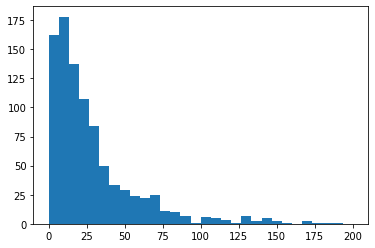

In [41]:
plt.hist(sj_df.total_cases, bins=30, range=[0, 200])
plt.show()

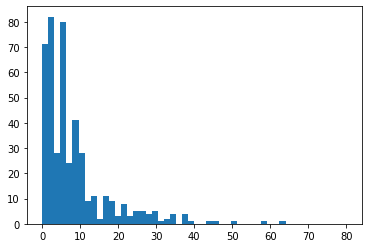

In [44]:
plt.hist(iq_df.total_cases, bins=50, range=[0, 80])
plt.show()

In [61]:
sj_time_series.head()

,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
607,1,sj,2002,1,37,2002-01-01,0.054750,0.081033,0.197543,0.142329,...,2.50,76.434286,0.0,15.810000,2.514286,25.528571,7.600000,30.0,20.6,24.9
608,1,sj,2002,2,38,2002-01-08,0.106425,0.290000,0.246433,0.177817,...,13.80,80.572857,0.0,16.178571,2.785714,25.457143,6.385714,29.4,21.7,13.7
609,1,sj,2002,3,34,2002-01-15,0.059400,0.052600,0.195671,0.156286,...,1.21,76.734286,0.0,15.518571,3.200000,25.328571,7.042857,29.4,21.1,2.9
610,1,sj,2002,4,26,2002-01-22,0.028800,0.066633,0.134100,0.146229,...,12.44,78.078571,0.0,15.551429,1.942857,26.214286,6.400000,30.6,22.2,19.1
611,0,sj,2002,5,19,2002-01-29,-0.019300,0.056717,0.146636,0.127979,...,10.80,76.920000,0.0,15.187143,2.185714,25.657143,5.771429,29.4,21.7,38.1


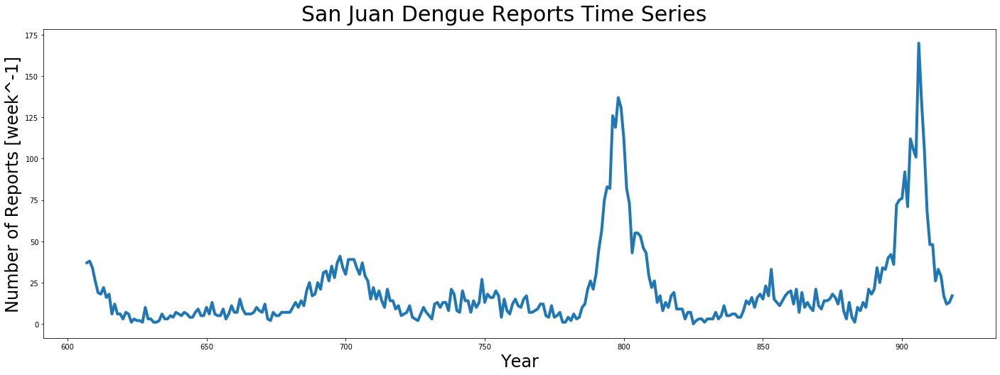

In [96]:
fig, ax = plt.subplots(figsize=(24, 8))
plt.plot(sj_time_series.total_cases, linewidth=4)
plt.figtext(.5,.9,'San Juan Dengue Reports Time Series', fontsize=30, ha='center')# plt.xlim(1990, 2009)
plt.xlabel("Year", fontsize=24)
plt.ylabel("Number of Reports [week^-1]", fontsize=24)
# ax.set_ylim(0, 180)
# ax.set_xticklabels(2002, 2007)
# ax.set_xticklabels = np.arange(2002, 2007, 1)
plt.show()

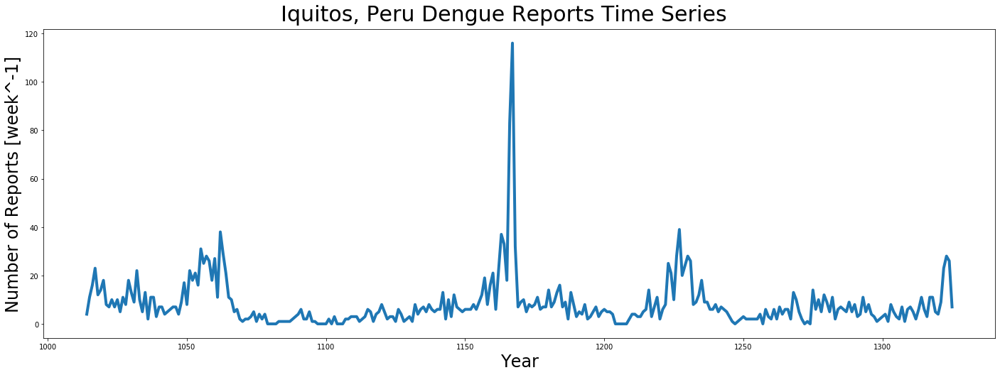

In [95]:
fig, ax = plt.subplots(figsize=(24, 8))
plt.plot(iq_time_series.total_cases, linewidth=4)
plt.figtext(.5,.9,'Iquitos, Peru Dengue Reports Time Series', fontsize=30, ha='center')
plt.xlabel("Year", fontsize=24)
plt.ylabel("Number of Reports [week^-1]", fontsize=24)
# ax.set_ylim(0, 180)
plt.show()

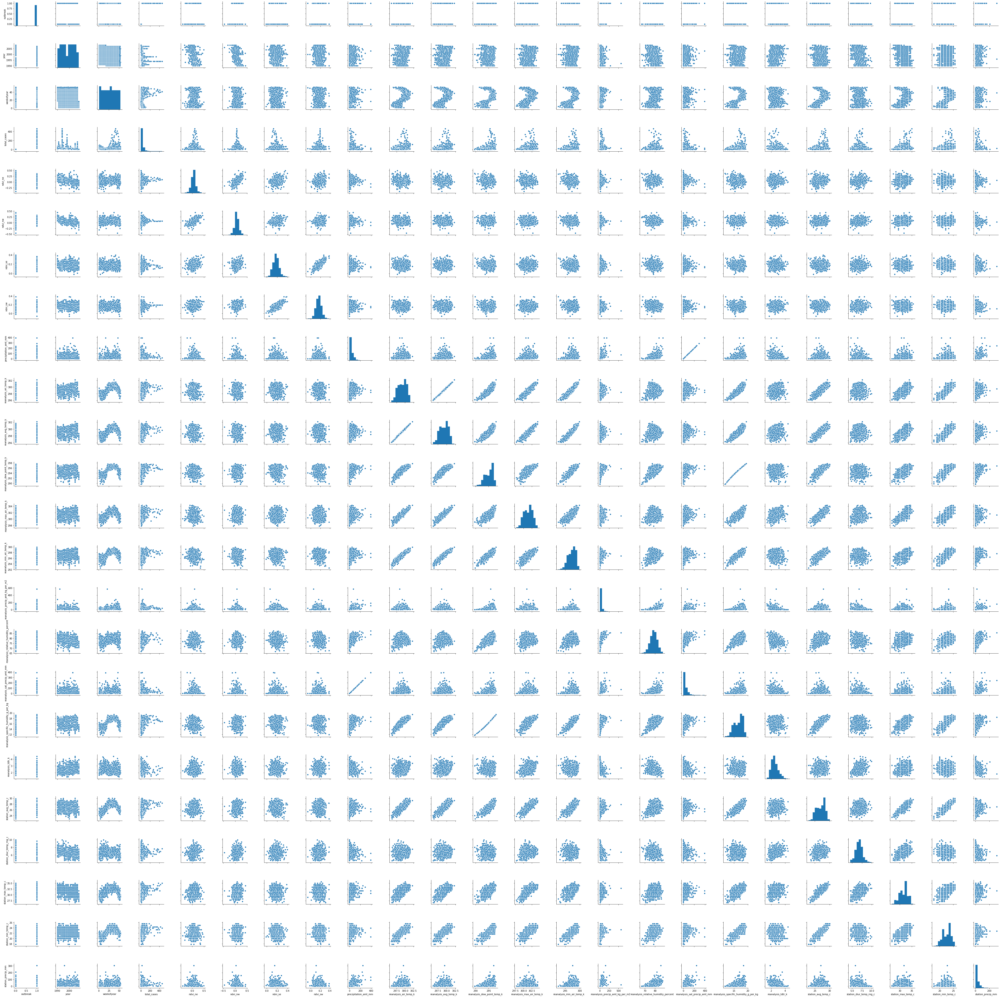

In [49]:
sns.pairplot(sj_df)

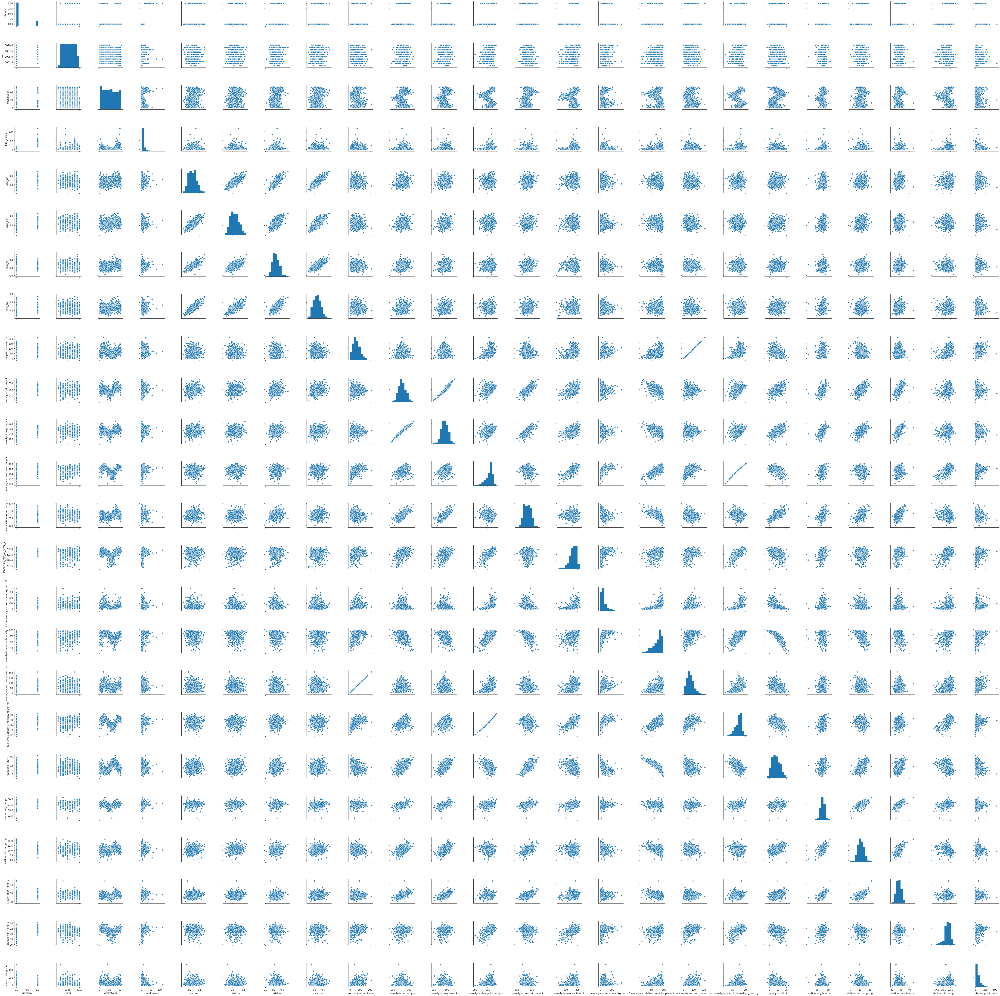

In [50]:
sns.pairplot(iq_df)

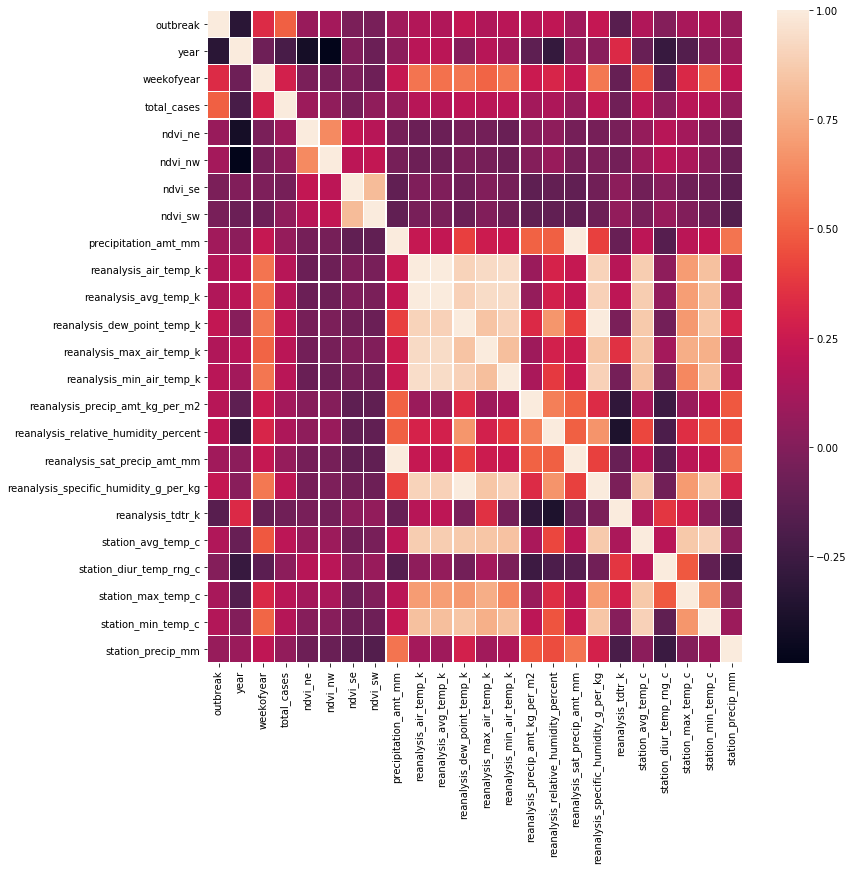

In [57]:
plt.figure(figsize=(12, 12))
sns.heatmap(data=sj_df.corr(), linewidths=0.3)
plt.show()

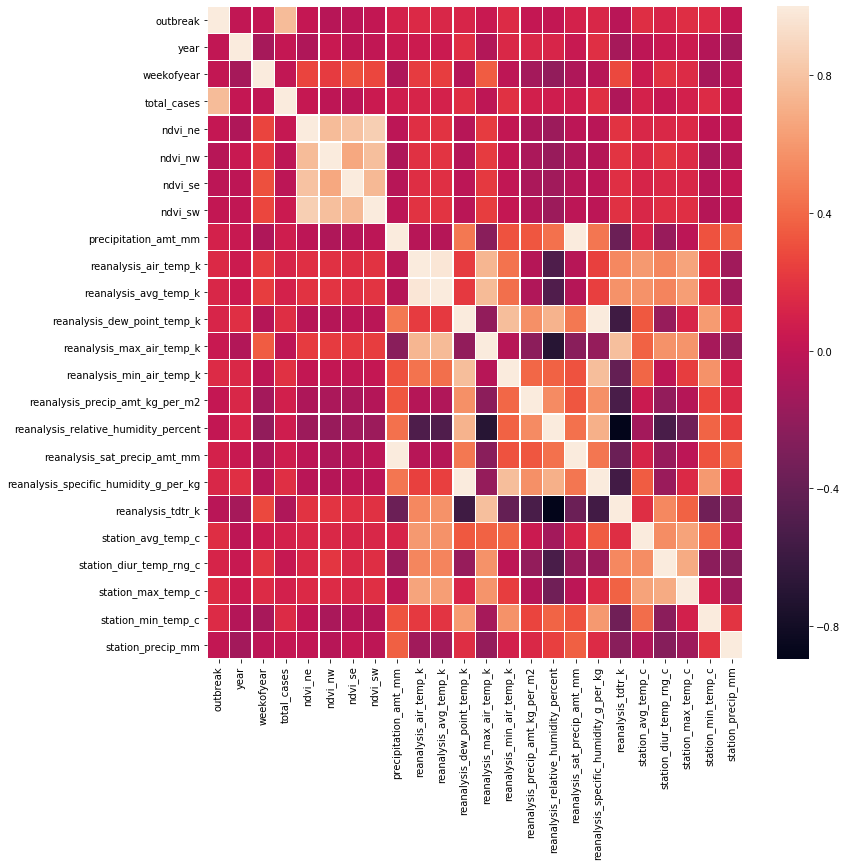

In [53]:
plt.figure(figsize=(12, 12))
sns.heatmap(data=iq_df.corr(), linewidths=0.3)
plt.show()

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24]), <a list of 24 Text xticklabel objects>)

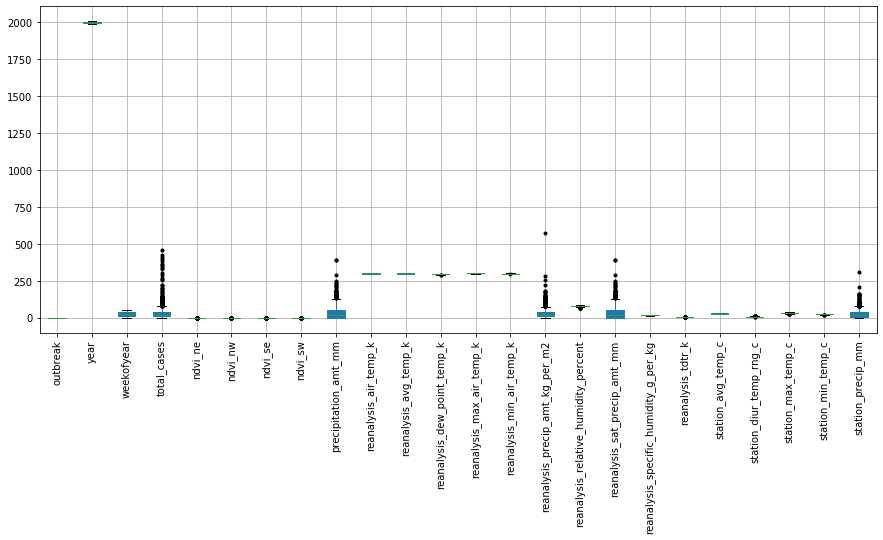

In [58]:
plt.subplots(figsize=(15,6))
sj_df.boxplot(patch_artist=True, sym="k.")
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24]), <a list of 24 Text xticklabel objects>)

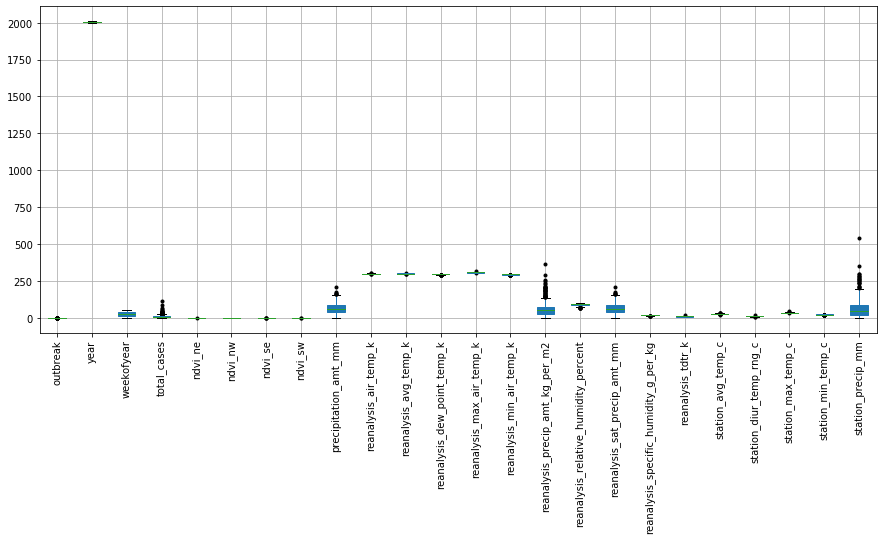

In [71]:
plt.subplots(figsize=(15,6))
iq_df.boxplot(patch_artist=True, sym="k.")
plt.xticks(rotation=90)

In [64]:
with open('sj_df.pickle', 'wb') as to_write:
    pickle.dump(sj_df, to_write)
    
with open('iq_df.pickle', 'wb') as to_write:
    pickle.dump(iq_df, to_write)

In [65]:
testdf = pd.read_csv('/Users/joelporcaro/Metis/project5/data/dengue_features_test.csv')

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
250,sj,2013,8,2013-02-19,-0.051800,-0.025025,0.209729,0.187014,0.00,298.035714,...,0.30,72.794286,0.00,14.190000,2.771429,25.628571,6.971429,31.1,21.1,0.3
251,sj,2013,9,2013-02-26,-0.006125,0.007633,0.128033,0.134883,0.00,298.088571,...,1.50,73.917143,0.00,14.455714,2.871429,25.800000,6.585714,30.0,22.2,4.1
252,sj,2013,10,2013-03-05,NaN,-0.013600,0.031929,0.000500,23.06,298.191429,...,4.60,73.037143,23.06,14.411429,3.628571,26.671429,8.400000,32.8,21.7,6.6
253,sj,2013,11,2013-03-12,0.008000,0.054875,0.244329,0.221943,0.00,297.157143,...,13.50,72.562857,0.00,13.458571,2.128571,25.357143,5.471429,30.0,21.7,17.1
254,sj,2013,12,2013-03-19,-0.045150,0.006225,0.107514,0.116700,0.00,297.288571,...,4.80,68.181429,0.00,12.705714,3.057143,25.842857,6.471429,29.4,21.7,4.8
255,sj,2013,13,2013-03-26,-0.087400,-0.016183,0.156343,0.105186,30.34,298.670000,...,2.55,78.780000,30.34,15.985714,3.314286,27.542857,7.942857,33.9,22.8,3.5
256,sj,2013,14,2013-04-02,-0.203250,-0.077833,0.204171,0.178914,6.55,298.035714,...,64.30,81.650000,6.55,15.881429,2.828571,26.642857,6.642857,33.3,22.8,17.6
257,sj,2013,15,2013-04-09,-0.117600,-0.008200,0.192700,0.170429,0.00,299.057143,...,0.70,78.285714,0.00,16.212857,3.171429,27.914286,8.114286,32.8,23.3,9.4
258,sj,2013,16,2013-04-16,0.082750,0.031200,0.135014,0.074857,0.00,298.912857,...,1.40,77.674286,0.00,15.965714,3.042857,27.728571,6.942857,31.7,23.9,22.9
259,sj,2013,17,2013-04-23,-0.087300,-0.048667,0.129814,0.117671,45.47,298.067143,...,19.90,79.045714,45.47,15.451429,2.342857,26.442857,6.742857,31.1,21.7,47.5


TypeError: 'numpy.ndarray' object is not callable

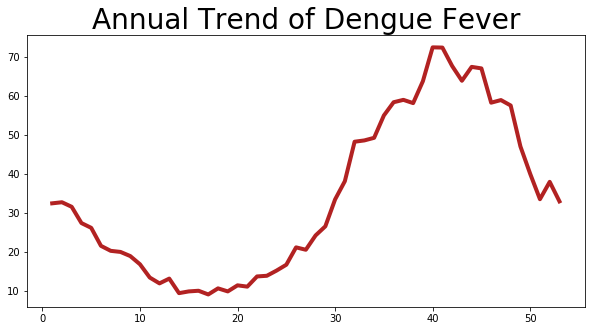

In [130]:
plt.figure(figsize=(10, 5))
plt.plot(sj_df.groupby('weekofyear').mean()['total_cases'], linewidth=4, c='firebrick')
plt.title("Annual Trend of Dengue Fever", fontsize=28)
plt.yticks(fontsize=24)

In [104]:
def annual_trend(df, year):
    df = df[df['year'] == year]
    df.plot.bar('weekofyear', 'total_cases', legend=False, ylim=(0, 300), figsize=(8, 4))
    plt.title(str(year))

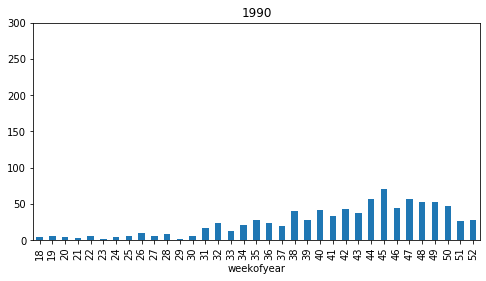

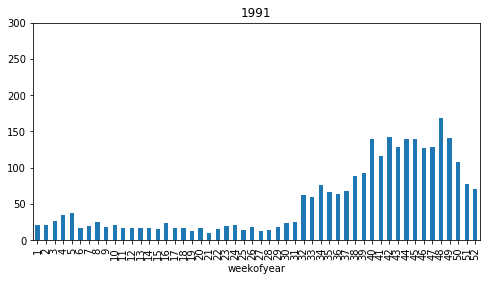

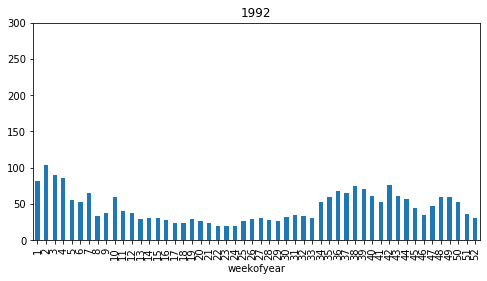

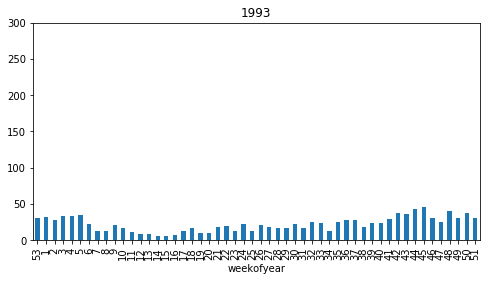

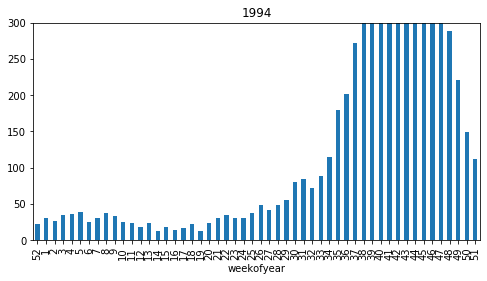

...

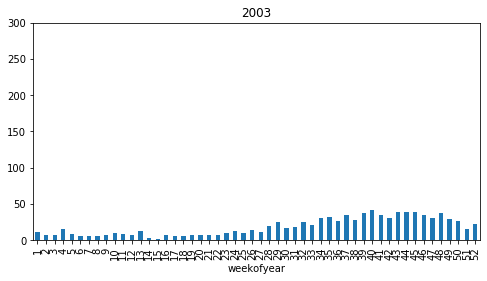

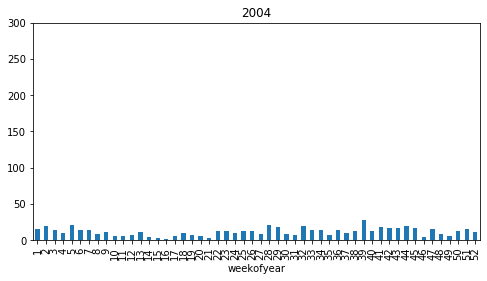

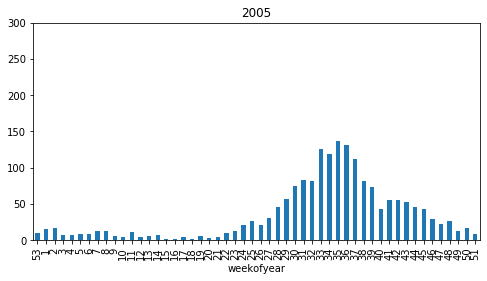

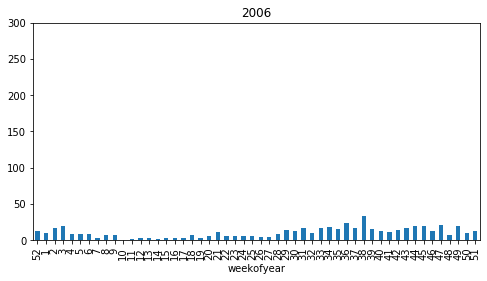

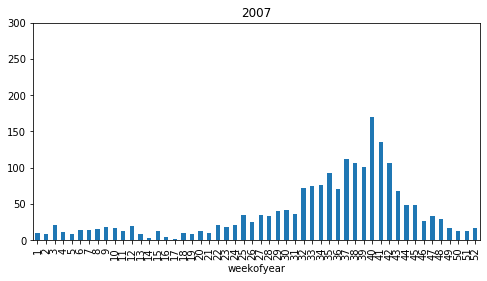

In [103]:
for year in range(1990, 2008):
    annual_trend(sj_df, year)

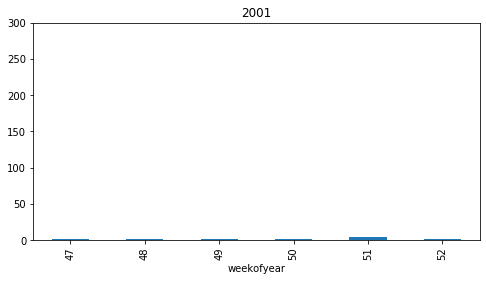

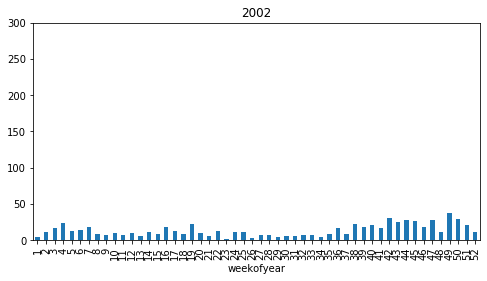

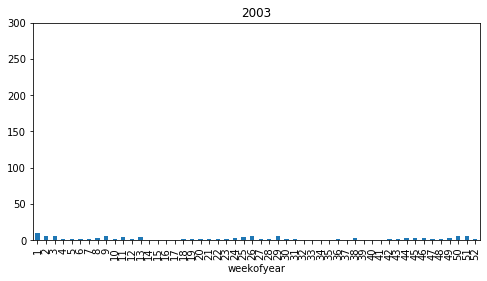

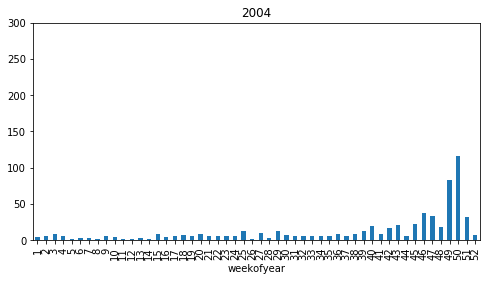

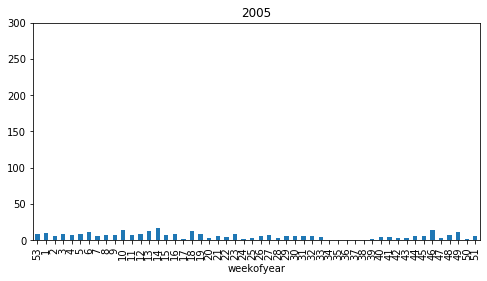

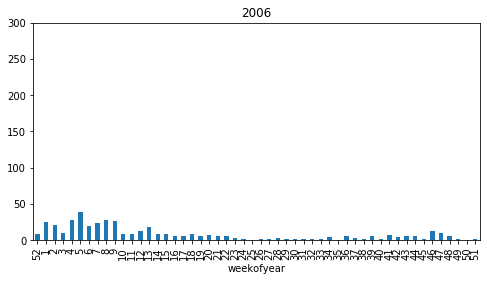

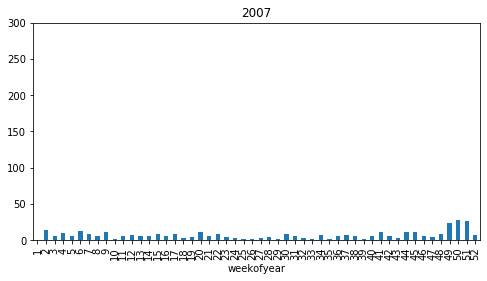

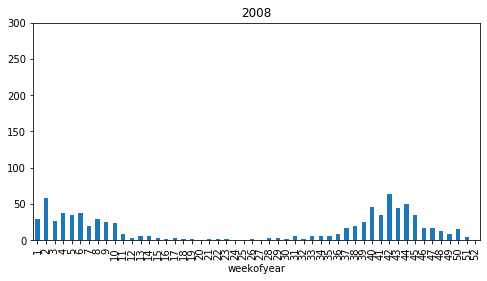

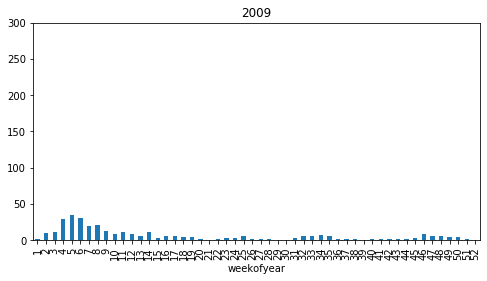

In [105]:
for year in range(2001, 2010):
    annual_trend(iq_df, year)

In [107]:
def att_hist(feature):
    fig, ax = plt.subplots(figsize=(10,10))
    sns.distplot(sj_df[sj_df['outbreak']==1][feature], color='r')
    sns.distplot(sj_df[sj_df['outbreak']==0][feature], ax=ax, color='b')

In [111]:
sj_df['isFallorWinter'] = np.where(sj_df['weekofyear'] >= 35, 1, 0)

In [112]:
sj_df.head()

,outbreak,city,year,weekofyear,total_cases,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,isFallorWinter
0,0,sj,1990,18,4,1990-04-30,0.122600,0.103725,0.198483,0.177617,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,0
1,0,sj,1990,19,5,1990-05-07,0.169900,0.142175,0.162357,0.155486,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,0
2,0,sj,1990,20,4,1990-05-14,0.032250,0.172967,0.157200,0.170843,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,0
3,0,sj,1990,21,3,1990-05-21,0.128633,0.245067,0.227557,0.235886,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,0
4,0,sj,1990,22,6,1990-05-28,0.196200,0.262200,0.251200,0.247340,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,0


/Users/joelporcaro/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



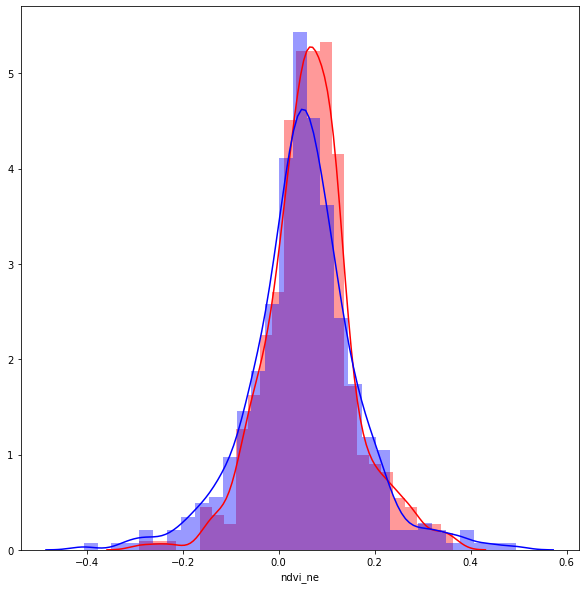

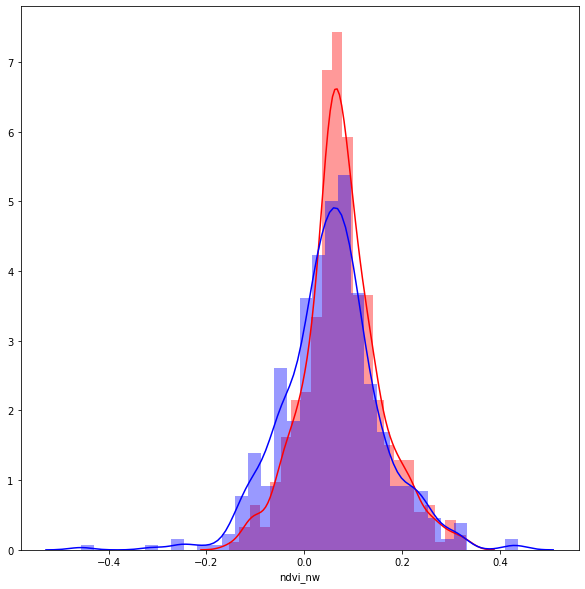

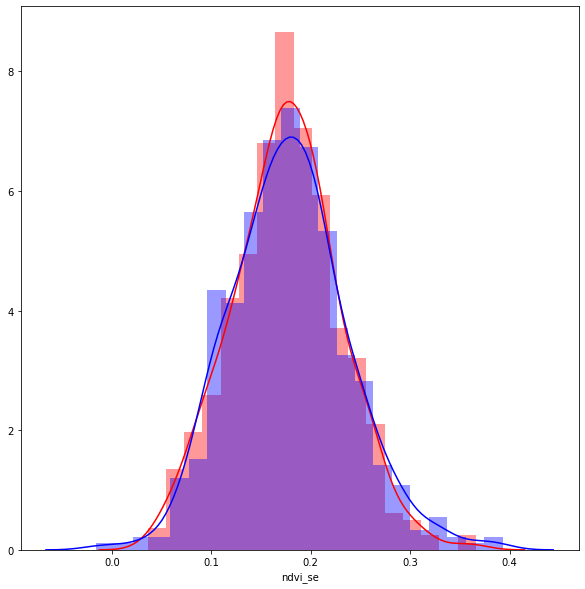

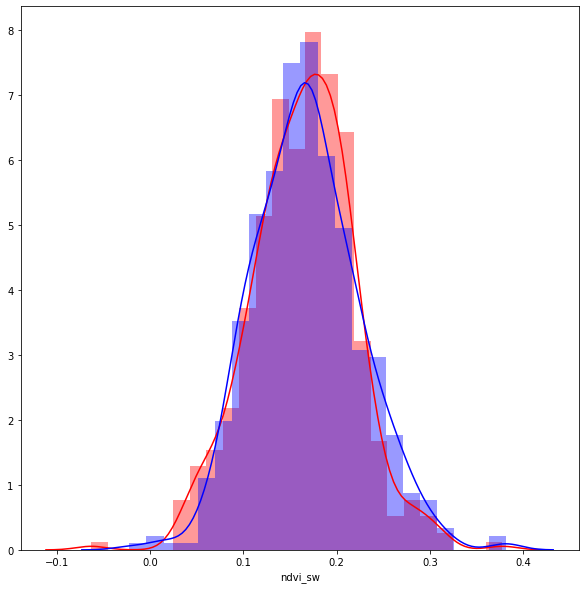

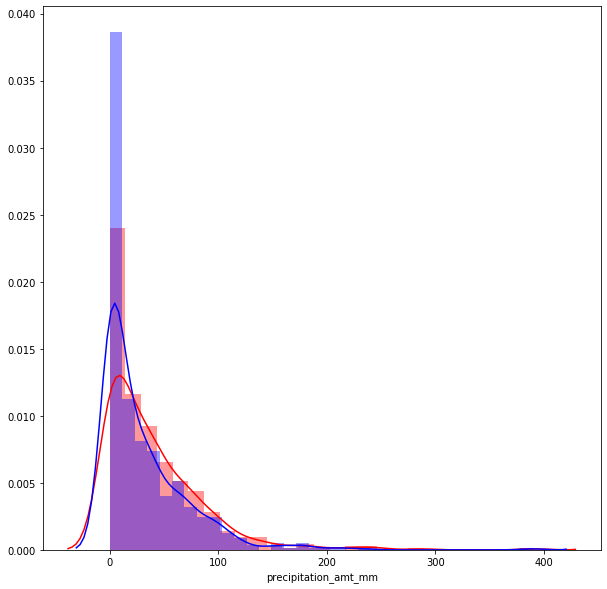

...

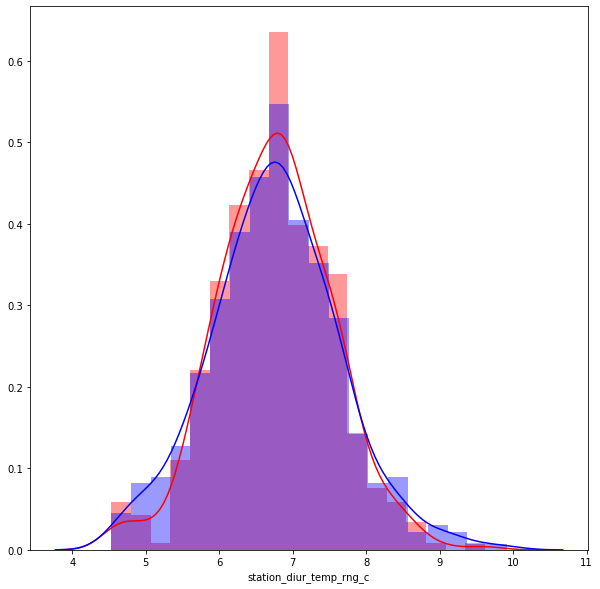

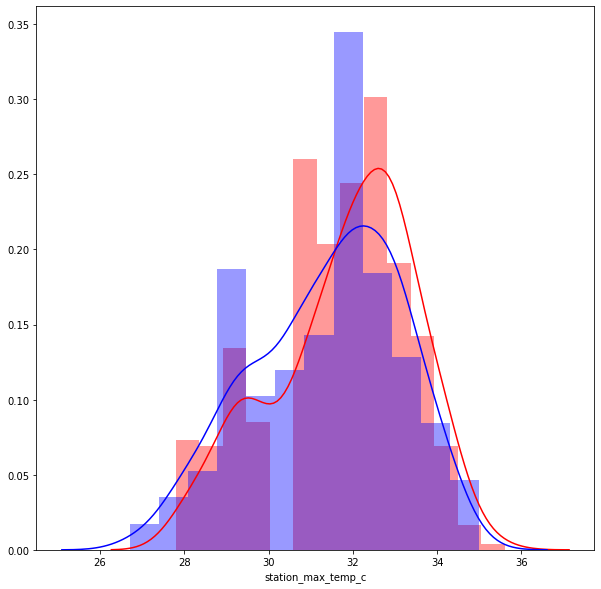

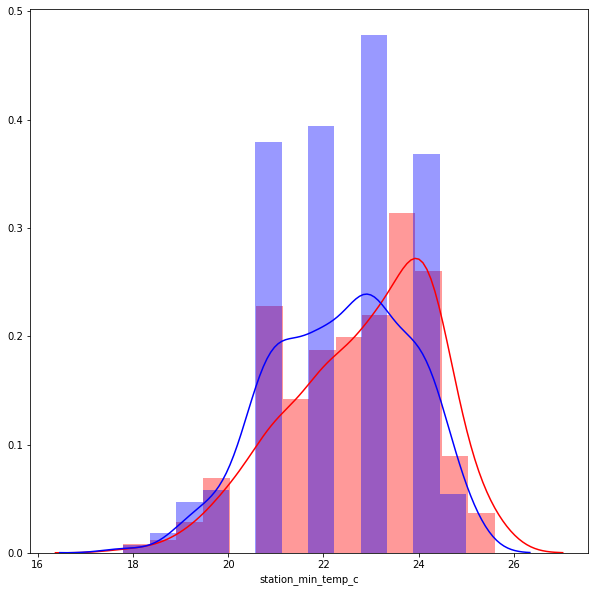

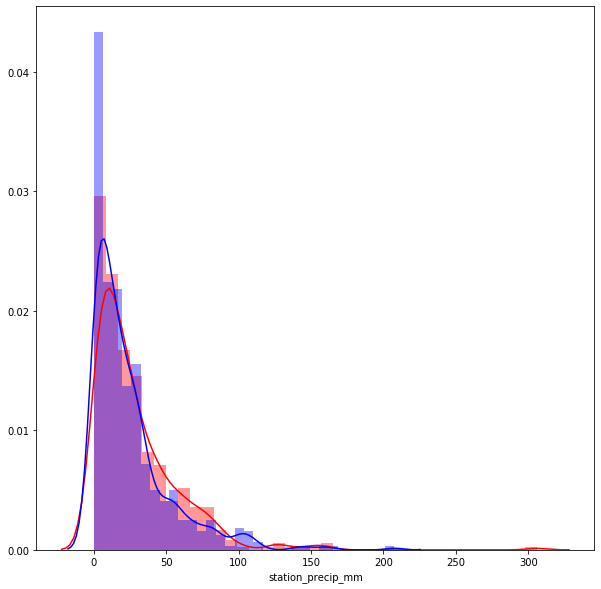

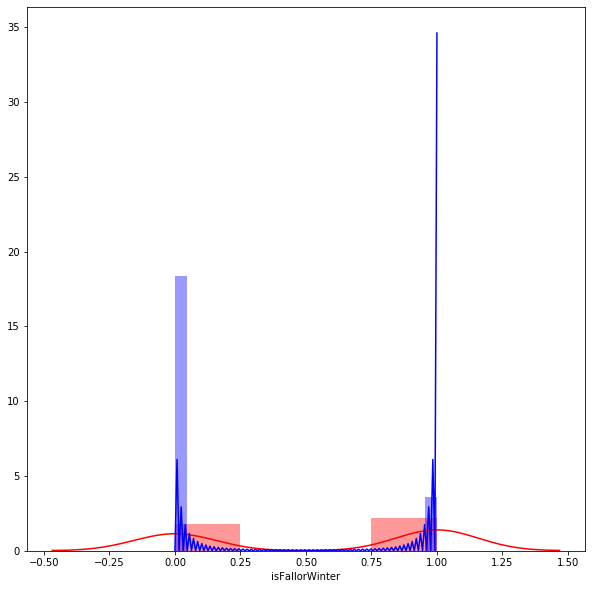

In [113]:
for feature in sj_df.iloc[:, 6:].columns:
    att_hist(feature)

(array([  4.,   8.,  53.,  68., 180., 101., 123., 246., 107.,  46.]),
 array([17.8 , 18.58, 19.36, 20.14, 20.92, 21.7 , 22.48, 23.26, 24.04,
        24.82, 25.6 ]),
 <a list of 10 Patch objects>)

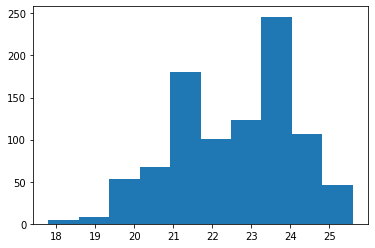

In [116]:
plt.hist(sj_df.station_min_temp_c)